In [71]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier # brew install libomp
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

In [2]:
shared = pd.read_table("../data/baxter.0.03.subsample.shared")
meta = pd.read_table("../data/metadata.tsv")

In [14]:
meta = meta[['sample','Dx_Bin', 'Age', 'Gender', 'Smoke', 'Diabetic', 'BMI']]
meta['Gender'] = meta['Gender'].replace({'m': 1, 'f': 0})
meta['Diabetic'] = meta['Diabetic'].replace({np.nan: 1.0})
meta['Smoke'] = meta['Smoke'].replace({np.nan: 2.0})
meta['BMI'] = meta['BMI'].replace({np.nan: meta['BMI'].mean()})
## Rename the column name "Group" to match the "sample" in meta
shared = shared.rename(index=str, columns={"Group":"sample"})
## Merge the 2 datasets on sample
data=pd.merge(meta,shared,on=['sample'])
## Drop all except OTU columns for x
x = data.drop(["sample", 'Dx_Bin', "numOtus", "label", 'Diabetic'], axis=1)

y = data['Diabetic']
# y = np.eye(2, dtype='uint8')[y]
## Drop if NA elements
# y = y.dropna()
y= y.values
# x = x.dropna()

In [15]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42, stratify=y)

In [5]:
from sklearn.feature_selection import SelectKBest, f_classif# Example: Assuming 'label' column represents the clinical label you're interested in
XX = shared.drop(['label', 'sample', 'numOtus'], axis=1)  # Drop non-OTU columns to get only OTU features
y1 = meta['Diabetic']  # This is the clinical feature you're analyzing

In [38]:
# Perform feature selection
selector = SelectKBest(f_classif, k=50)  # Select top 50 features (you can adjust the number as needed)
X_new = selector.fit_transform(XX, y1)

# Get the columns selected
selected_columns = XX.columns[selector.get_support(indices=True)]

# Create a new DataFrame with the selected OTUs
reduced_otu_table = shared[selected_columns]

In [8]:
additional_columns = ['Age', 'Gender', 'Smoke', 'BMI']

# Combine selected OTU columns with additional columns
final_columns = list(selected_columns) + additional_columns

In [9]:
data=pd.merge(meta,shared,on=['sample'])
## Drop all except OTU columns for x
x = data.drop(["sample", 'Dx_Bin', "numOtus", "label", 'Diabetic'], axis=1)
x = x[final_columns]
y = data['Diabetic']
# y = np.eye(2, dtype='uint8')[y]
## Drop if NA elements
# y = y.dropna()
y= y.values

In [40]:
x[final_columns]

,Otu00025,Otu00064,Otu00116,Otu00284,Otu00293,Otu00296,Otu00358,Otu00432,Otu00444,Otu00465,...,Otu03216,Otu03304,Otu03320,Otu03324,Otu03390,Otu05195,Age,Gender,Smoke,BMI
0,45,0,0,0,0,0,3,0,0,3,...,0,0,0,0,0,0,64,1,2.0,36.227509
1,7,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,0,61,1,0.0,27.968016
2,101,0,133,0,0,15,0,0,0,0,...,0,0,0,0,0,0,47,0,0.0,21.799308
3,37,89,0,0,0,0,3,0,0,0,...,0,0,0,0,0,0,81,0,1.0,23.030045
4,15,0,0,0,0,0,0,0,0,2,...,0,0,0,0,0,0,44,0,0.0,24.913495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
485,34,1,0,0,0,0,2,0,0,0,...,0,0,0,0,0,0,53,0,0.0,33.593750
486,58,0,0,0,0,37,0,0,0,0,...,0,0,0,0,0,0,75,1,1.0,27.173119
487,206,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,56,0,0.0,26.953125
488,7,0,0,0,0,0,0,3,0,0,...,0,0,0,0,0,0,77,1,1.0,23.735308


In [41]:
x_train1, x_test1, y_train1, y_test1 = train_test_split(x[final_columns], y, test_size=0.3, random_state=42, stratify=y)

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [19:34:23] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


                 Model  Accuracy  Precision    Recall  F1 Score       AUC
0        Random Forest  0.884354   0.000000  0.000000  0.000000  0.500000
1              XGBoost  0.884354   0.500000  0.058824  0.105263  0.525566
2  Logistic Regression  0.768707   0.130435  0.176471  0.150000  0.511312


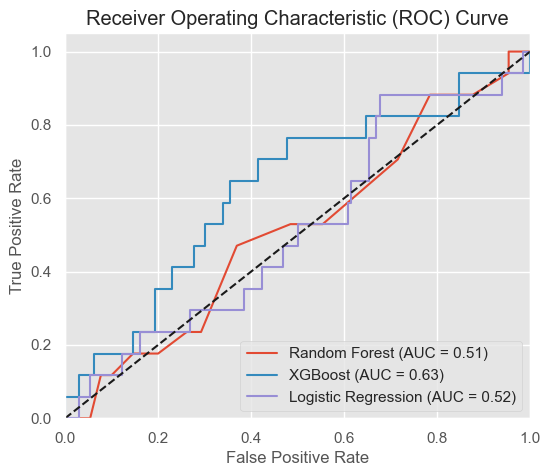

In [55]:
# Initialize the models
rf_model = RandomForestClassifier(random_state=42)
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the models
rf_model.fit(x_train, y_train)
xgb_model.fit(x_train, y_train)
lr_model.fit(x_train, y_train)
# Predictions
rf_pred = rf_model.predict(x_test)
xgb_pred = xgb_model.predict(x_test)
lr_pred = lr_model.predict(x_test)

# Calculate accuracy metrics
metrics = {
    'Model': ['Random Forest', 'XGBoost', 'Logistic Regression'],
    'Accuracy': [
        accuracy_score(y_test, rf_pred),
        accuracy_score(y_test, xgb_pred),
        accuracy_score(y_test, lr_pred)
    ],
    'Precision': [
        precision_score(y_test, rf_pred),
        precision_score(y_test, xgb_pred),
        precision_score(y_test, lr_pred)
    ],
    'Recall': [
        recall_score(y_test, rf_pred),
        recall_score(y_test, xgb_pred),
        recall_score(y_test, lr_pred)
    ],
    'F1 Score': [
        f1_score(y_test, rf_pred),
        f1_score(y_test, xgb_pred),
        f1_score(y_test, lr_pred)
    ],
    'AUC': [
        roc_auc_score(y_test, rf_pred),
        roc_auc_score(y_test, xgb_pred),
        roc_auc_score(y_test, lr_pred)
    ]
}

metrics_df = pd.DataFrame(metrics)
print(metrics_df)
# Calculate ROC curves and AUCs
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_model.predict_proba(x_test)[:,1])
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, xgb_model.predict_proba(x_test)[:,1])
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_model.predict_proba(x_test)[:,1])

# Plot ROC curves
plt.figure(figsize=(6, 5))
plt.plot(rf_fpr, rf_tpr, label=f"Random Forest (AUC = {auc(rf_fpr, rf_tpr):.2f})")
plt.plot(xgb_fpr, xgb_tpr, label=f"XGBoost (AUC = {auc(xgb_fpr, xgb_tpr):.2f})")
plt.plot(lr_fpr, lr_tpr, label=f"Logistic Regression (AUC = {auc(lr_fpr, lr_tpr):.2f})")
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [07:01:01] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


                 Model  Accuracy  Precision    Recall  F1 Score       AUC
0        Random Forest  0.884354   0.500000  0.058824  0.105263  0.525566
1              XGBoost  0.877551   0.400000  0.117647  0.181818  0.547285
2  Logistic Regression  0.863946   0.333333  0.176471  0.230769  0.565158


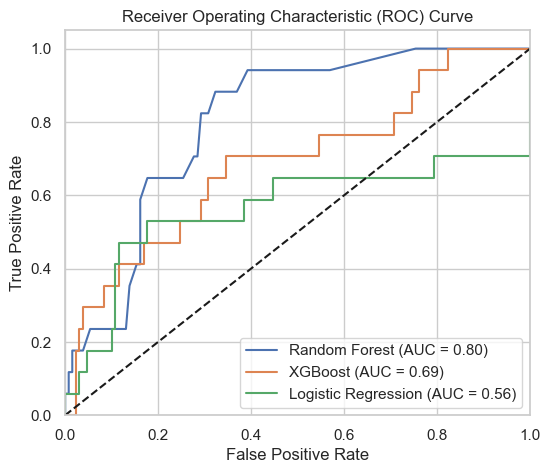

In [60]:
# Initialize the models
rf_model = RandomForestClassifier(random_state=42)
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Train the models
rf_model.fit(x_train1, y_train1)
xgb_model.fit(x_train1, y_train1)
lr_model.fit(x_train1, y_train1)
# Predictions
rf_pred = rf_model.predict(x_test1)
xgb_pred = xgb_model.predict(x_test1)
lr_pred = lr_model.predict(x_test1)

# Calculate accuracy metrics
metrics = {
    'Model': ['Random Forest', 'XGBoost', 'Logistic Regression'],
    'Accuracy': [
        accuracy_score(y_test, rf_pred),
        accuracy_score(y_test, xgb_pred),
        accuracy_score(y_test, lr_pred)
    ],
    'Precision': [
        precision_score(y_test, rf_pred),
        precision_score(y_test, xgb_pred),
        precision_score(y_test, lr_pred)
    ],
    'Recall': [
        recall_score(y_test, rf_pred),
        recall_score(y_test, xgb_pred),
        recall_score(y_test, lr_pred)
    ],
    'F1 Score': [
        f1_score(y_test, rf_pred),
        f1_score(y_test, xgb_pred),
        f1_score(y_test, lr_pred)
    ],
    'AUC': [
        roc_auc_score(y_test, rf_pred),
        roc_auc_score(y_test, xgb_pred),
        roc_auc_score(y_test, lr_pred)
    ]
}

metrics_df = pd.DataFrame(metrics)
print(metrics_df)
# Calculate ROC curves and AUCs
rf_fpr, rf_tpr, _ = roc_curve(y_test, rf_model.predict_proba(x_test1)[:,1])
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, xgb_model.predict_proba(x_test1)[:,1])
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_model.predict_proba(x_test1)[:,1])

# Plot ROC curves
plt.figure(figsize=(6, 5))
plt.plot(rf_fpr, rf_tpr, label=f"Random Forest (AUC = {auc(rf_fpr, rf_tpr):.2f})")
plt.plot(xgb_fpr, xgb_tpr, label=f"XGBoost (AUC = {auc(xgb_fpr, xgb_tpr):.2f})")
plt.plot(lr_fpr, lr_tpr, label=f"Logistic Regression (AUC = {auc(lr_fpr, lr_tpr):.2f})")
plt.plot([0, 1], [0, 1], 'k--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [46]:
import shap

# For XGBoost
# Initialize the SHAP explainer
explainer_xgb = shap.TreeExplainer(xgb_model)
# Calculate SHAP values
shap_values_xgb = explainer_xgb.shap_values(x_test1)

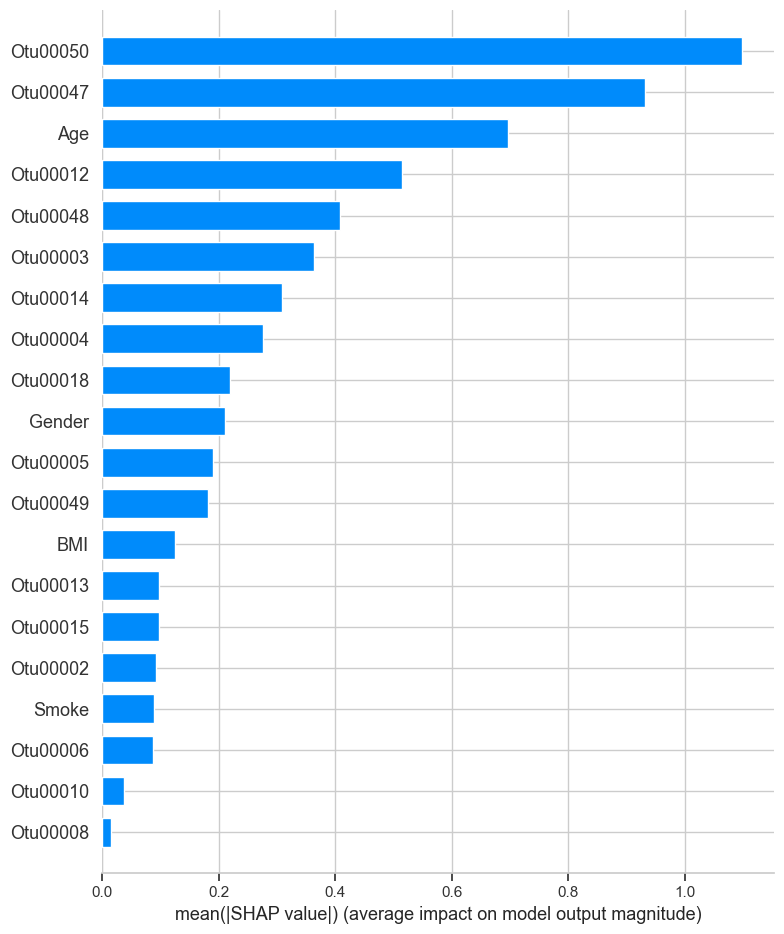

In [59]:
shap.summary_plot(shap_values_xgb, x_test1, plot_type="bar", feature_names=x.columns)

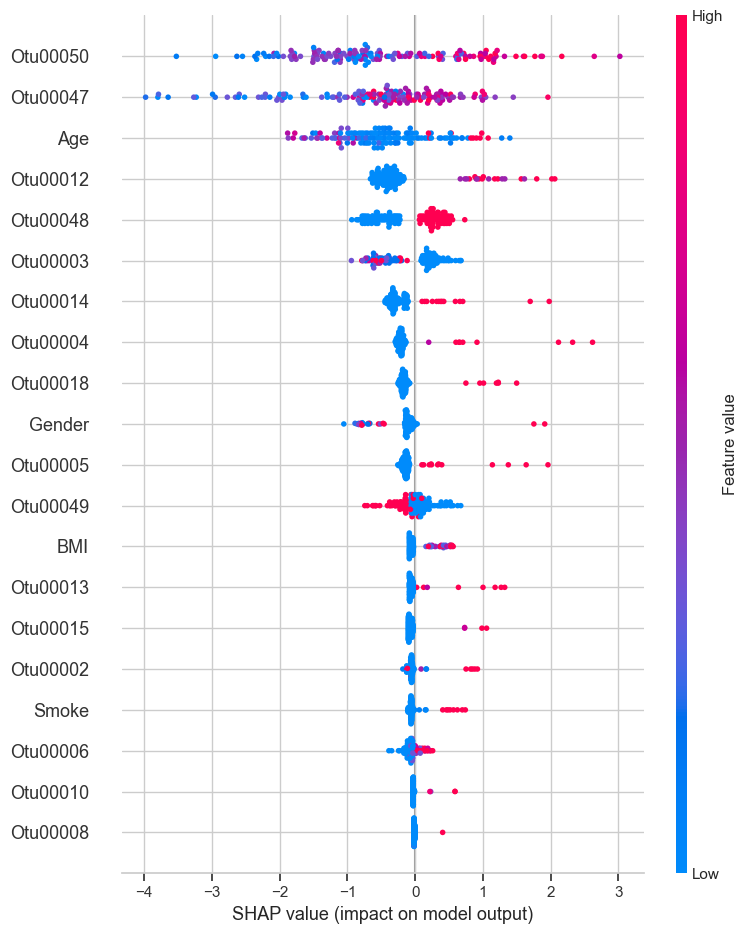

In [58]:
shap.summary_plot(shap_values_xgb, x_test1, feature_names=x.columns)

In [21]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV

In [22]:
# Parameter grids for each model
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9],
    # 'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 1],
    'colsample_bytree': [0.8, 1]
}

lgbm_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [-1, 10, 20, 30],
    # 'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [31, 50, 100],
    'min_child_samples': [20, 40, 60]
}

lr_param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['newton-cg', 'lbfgs', 'liblinear']
}

In [24]:
# Initialize the models
rf_model = RandomForestClassifier(random_state=42)
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)
lgbm_model = LGBMClassifier(random_state=42)
lr_model = LogisticRegression(random_state=42, max_iter=1000)

# Set up Grid Search for each model
rf_grid_search = GridSearchCV(estimator=rf_model, param_grid=rf_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
xgb_grid_search = GridSearchCV(estimator=xgb_model, param_grid=xgb_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lgbm_grid_search = GridSearchCV(estimator=lgbm_model, param_grid=lgbm_param_grid, cv=5, scoring='accuracy', n_jobs=-1)
lr_grid_search = GridSearchCV(estimator=lr_model, param_grid=lr_param_grid, cv=5, scoring='accuracy', n_jobs=-1)

In [25]:
# Train the models using Grid Search
rf_grid_search.fit(x_train, y_train)
xgb_grid_search.fit(x_train, y_train)
lgbm_grid_search.fit(x_train, y_train)
# lr_grid_search.fit(x_train, y_train)

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [12:48:58] WARNING: /Users/runner/work/xgboost/xgboost/src

[LightGBM] [Info] Number of positive: 33, number of negative: 242[LightGBM] [Info] Number of positive: 33, number of negative: 241

[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 33, number of negative: 242
[LightGBM] [Info] Number of positive: 32, number of negative: 242
[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 32, number of negative: 242
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.105716 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 10619
[LightGBM] [Info] Number of data points in the train set: 274, number of used features: 668
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.120438 -> initscore=-1.988289
[LightGBM] [Info] Start training from s

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 41, number of negative: 302
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 12710
[LightGBM] [Info] Number of data points in the train set: 343, number of used features: 749
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.119534 -> initscore=-1.996855
[LightGBM] [Info] Start training from score -1.996855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -i

GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [-1, 10, 20, 30],
                         'min_child_samples': [20, 40, 60],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [31, 50, 100]},
             scoring='accuracy')

In [26]:
# Get the best models
best_rf_model = rf_grid_search.best_estimator_
best_xgb_model = xgb_grid_search.best_estimator_
best_lgbm_model = lgbm_grid_search.best_estimator_
# best_lr_model = lr_grid_search.best_estimator_

In [28]:
lr_model.fit(x_train, y_train)

LogisticRegression(max_iter=1000, random_state=42)

In [29]:
# Predictions using the best models
rf_pred = best_rf_model.predict(x_test)
xgb_pred = best_xgb_model.predict(x_test)
lgbm_pred = best_lgbm_model.predict(x_test)
lr_pred = lr_model.predict(x_test)

In [30]:
# Calculate accuracy metrics
metrics = {
    'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'Logistic Regression'],
    'Accuracy': [
        accuracy_score(y_test, rf_pred),
        accuracy_score(y_test, xgb_pred),
        accuracy_score(y_test, lgbm_pred),
        accuracy_score(y_test, lr_pred)
    ],
    'Precision': [
        precision_score(y_test, rf_pred),
        precision_score(y_test, xgb_pred),
        precision_score(y_test, lgbm_pred),
        precision_score(y_test, lr_pred)
    ],
    'Recall': [
        recall_score(y_test, rf_pred),
        recall_score(y_test, xgb_pred),
        recall_score(y_test, lgbm_pred),
        recall_score(y_test, lr_pred)
    ],
    'F1 Score': [
        f1_score(y_test, rf_pred),
        f1_score(y_test, xgb_pred),
        f1_score(y_test, lgbm_pred),
        f1_score(y_test, lr_pred)
    ],
    'AUC': [
        roc_auc_score(y_test, rf_pred),
        roc_auc_score(y_test, xgb_pred),
        roc_auc_score(y_test, lgbm_pred),
        roc_auc_score(y_test, lr_pred)
    ]
}

# Convert the metrics dictionary to a DataFrame for easy viewing
metrics_df = pd.DataFrame(metrics)
metrics_df

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


,Model,Accuracy,Precision,Recall,F1 Score,AUC
0,Random Forest,0.884354,0.000000,0.000000,0.000000,0.500000
1,XGBoost,0.877551,0.333333,0.058824,0.100000,0.521719
2,LightGBM,0.891156,1.000000,0.058824,0.111111,0.529412
3,Logistic Regression,0.768707,0.130435,0.176471,0.150000,0.511312


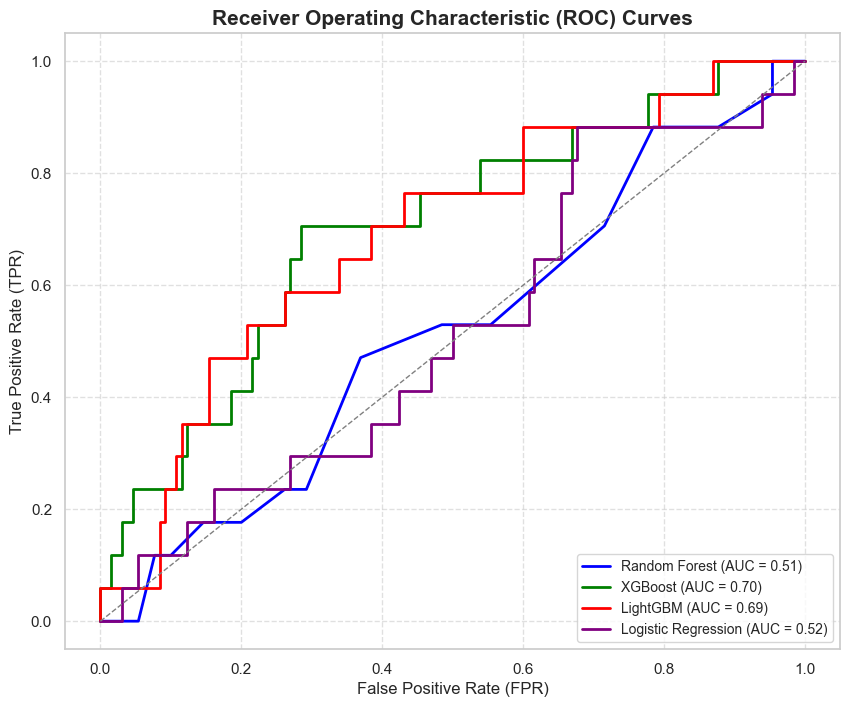

In [32]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Calculate ROC curves and AUCs
rf_fpr, rf_tpr, _ = roc_curve(y_test, best_rf_model.predict_proba(x_test)[:, 1])
xgb_fpr, xgb_tpr, _ = roc_curve(y_test, best_xgb_model.predict_proba(x_test)[:, 1])
lgbm_fpr, lgbm_tpr, _ = roc_curve(y_test, best_lgbm_model.predict_proba(x_test)[:, 1])
lr_fpr, lr_tpr, _ = roc_curve(y_test, lr_model.predict_proba(x_test)[:, 1])

# Calculate AUC scores
rf_auc = auc(rf_fpr, rf_tpr)
xgb_auc = auc(xgb_fpr, xgb_tpr)
lgbm_auc = auc(lgbm_fpr, lgbm_tpr)
lr_auc = auc(lr_fpr, lr_tpr)

# Plotting the ROC curves with enhanced aesthetics
plt.figure(figsize=(10, 8))
plt.plot(rf_fpr, rf_tpr, linestyle='-', color='blue', label=f'Random Forest (AUC = {rf_auc:.2f})', linewidth=2)
plt.plot(xgb_fpr, xgb_tpr, linestyle='-', color='green', label=f'XGBoost (AUC = {xgb_auc:.2f})', linewidth=2)
plt.plot(lgbm_fpr, lgbm_tpr, linestyle='-', color='red', label=f'LightGBM (AUC = {lgbm_auc:.2f})', linewidth=2)
plt.plot(lr_fpr, lr_tpr, linestyle='-', color='purple', label=f'Logistic Regression (AUC = {lr_auc:.2f})', linewidth=2)

# Plotting the random chance line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=1)

# Enhancing plot with titles and labels
plt.title('Receiver Operating Characteristic (ROC) Curves', fontsize=15, weight='bold')
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.legend(loc='lower right', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)

# Adding some style
plt.style.use('ggplot')

plt.show()

In [33]:
# For XGBoost
# Initialize the SHAP explainer
best_explainer_xgb = shap.TreeExplainer(best_xgb_model)
# Calculate SHAP values
best_shap_values_xgb = best_explainer_xgb.shap_values(x_test)

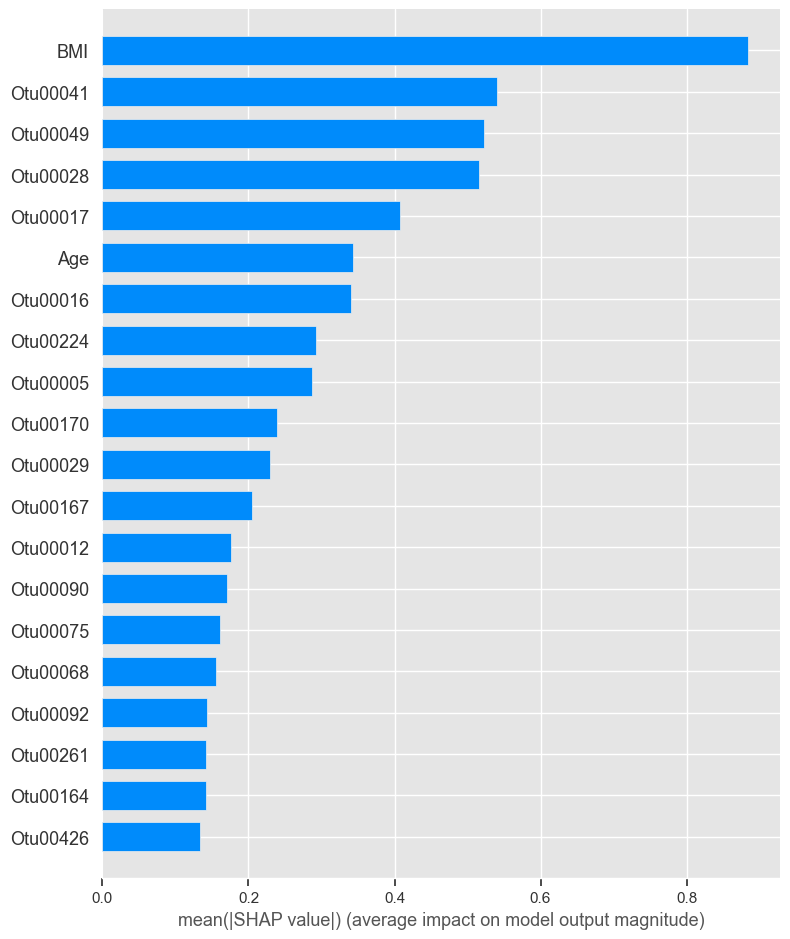

In [34]:
shap.summary_plot(best_shap_values_xgb, x_test, plot_type="bar", feature_names=x.columns)

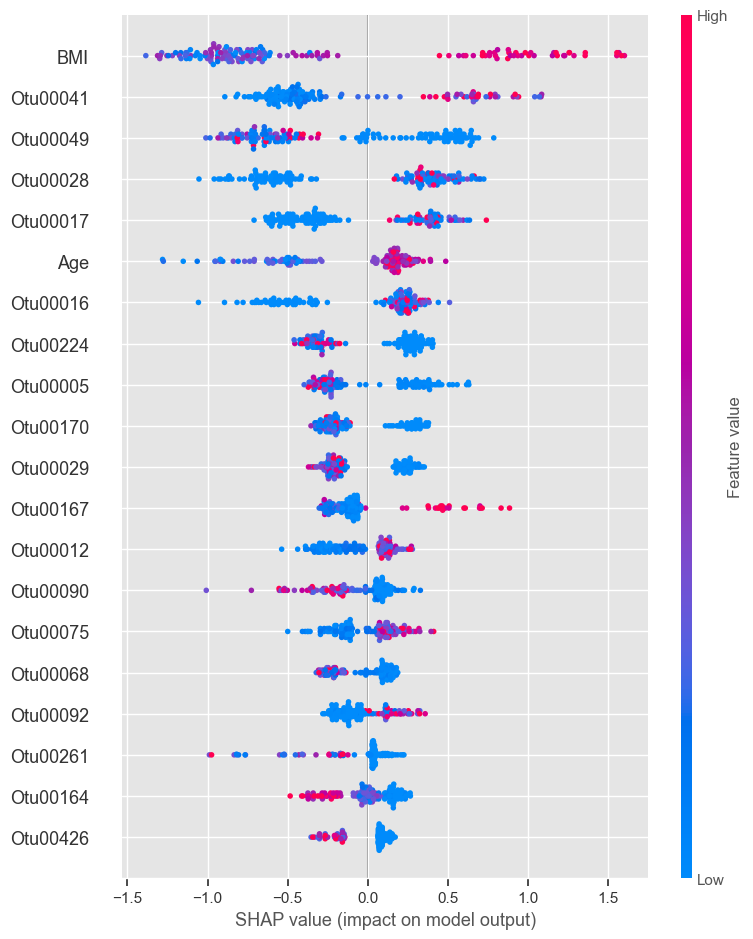

In [51]:
shap.summary_plot(best_shap_values_xgb, x_test, feature_names=x.columns)

In [37]:
shap.initjs()
explainer5xgb = shap.TreeExplainer(xgb_model)
shap_values5xgb = explainer5xgb.shap_values(x_test)
# shap.initjs()
def local_explainer_xgb(j):
    return(shap.force_plot(explainer_xgb.expected_value, shap_values5xgb[j,:], x_test.iloc[j,:]))
def local_explainer_logit(j):
    return(shap.force_plot(explainer_xgb.expected_value, shap_values5xgb[j,:], x_test.iloc[j,:], link='logit'))

(147, 6924)

In [61]:
# Train the models using Grid Search
rf_grid_search.fit(x_train1, y_train1)
xgb_grid_search.fit(x_train1, y_train1)
lgbm_grid_search.fit(x_train1, y_train1)

Python(75548) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(75549) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(75550) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(75551) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(75552) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(75553) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(75554) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
Python(75555) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning: [07:03:36] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:740: 
Parameters: { "use_label_e

[LightGBM] [Info] Number of positive: 33, number of negative: 242
[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 32, number of negative: 242
[LightGBM] [Info] Number of positive: 32, number of negative: 242
[LightGBM] [Info] Number of positive: 33, number of negative: 241
[LightGBM] [Info] Number of positive: 33, number of negative: 242
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013543 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 290[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014064 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Auto-choosing row-wise multi-threadi

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


[LightGBM] [Info] Number of positive: 41, number of negative: 302
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002071 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 364
[LightGBM] [Info] Number of data points in the train set: 343, number of used features: 18
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.119534 -> initscore=-1.996855
[LightGBM] [Info] Start training from score -1.996855
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf


GridSearchCV(cv=5, estimator=LGBMClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [-1, 10, 20, 30],
                         'min_child_samples': [20, 40, 60],
                         'n_estimators': [100, 200, 300],
                         'num_leaves': [31, 50, 100]},
             scoring='accuracy')

In [62]:
lr_model.fit(x_train1, y_train1)

/Users/kayadetunji/Documents/mBio_study_improv/new/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression(max_iter=1000, random_state=42)

In [63]:
# Get the best models
best_rf_model1 = rf_grid_search.best_estimator_
best_xgb_model1 = xgb_grid_search.best_estimator_
best_lgbm_model1 = lgbm_grid_search.best_estimator_

In [65]:
# Predictions using the best models
rf_pred1 = best_rf_model1.predict(x_test1)
xgb_pred1 = best_xgb_model1.predict(x_test1)
lgbm_pred1 = best_lgbm_model1.predict(x_test1)
lr_pred = lr_model.predict(x_test1)

In [66]:
# Calculate accuracy metrics
metrics = {
    'Model': ['Random Forest', 'XGBoost', 'LightGBM', 'Logistic Regression'],
    'Accuracy': [
        accuracy_score(y_test1, rf_pred1),
        accuracy_score(y_test1, xgb_pred1),
        accuracy_score(y_test1, lgbm_pred1),
        accuracy_score(y_test1, lr_pred)
    ],
    'Precision': [
        precision_score(y_test1, rf_pred1),
        precision_score(y_test1, xgb_pred1),
        precision_score(y_test1, lgbm_pred1),
        precision_score(y_test1, lr_pred)
    ],
    'Recall': [
        recall_score(y_test1, rf_pred1),
        recall_score(y_test1, xgb_pred1),
        recall_score(y_test1, lgbm_pred1),
        recall_score(y_test1, lr_pred)
    ],
    'F1 Score': [
        f1_score(y_test1, rf_pred1),
        f1_score(y_test1, xgb_pred1),
        f1_score(y_test1, lgbm_pred1),
        f1_score(y_test1, lr_pred)
    ],
    'AUC': [
        roc_auc_score(y_test1, rf_pred1),
        roc_auc_score(y_test1, xgb_pred1),
        roc_auc_score(y_test1, lgbm_pred1),
        roc_auc_score(y_test1, lr_pred)
    ]
}

# Convert the metrics dictionary to a DataFrame for easy viewing
metrics_df = pd.DataFrame(metrics)
metrics_df

,Model,Accuracy,Precision,Recall,F1 Score,AUC
0,Random Forest,0.884354,0.500000,0.058824,0.105263,0.525566
1,XGBoost,0.863946,0.000000,0.000000,0.000000,0.488462
2,LightGBM,0.877551,0.400000,0.117647,0.181818,0.547285
3,Logistic Regression,0.863946,0.333333,0.176471,0.230769,0.565158


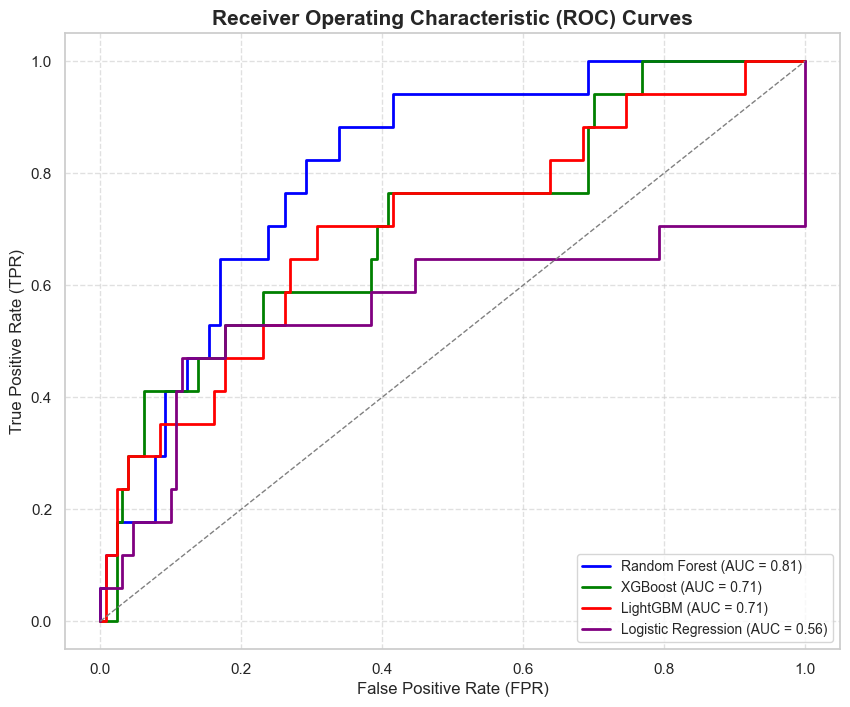

In [68]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Calculate ROC curves and AUCs
rf_fpr, rf_tpr, _ = roc_curve(y_test1, best_rf_model1.predict_proba(x_test1)[:, 1])
xgb_fpr, xgb_tpr, _ = roc_curve(y_test1, best_xgb_model1.predict_proba(x_test1)[:, 1])
lgbm_fpr, lgbm_tpr, _ = roc_curve(y_test1, best_lgbm_model1.predict_proba(x_test1)[:, 1])
lr_fpr, lr_tpr, _ = roc_curve(y_test1, lr_model.predict_proba(x_test1)[:, 1])

# Calculate AUC scores
rf_auc = auc(rf_fpr, rf_tpr)
xgb_auc = auc(xgb_fpr, xgb_tpr)
lgbm_auc = auc(lgbm_fpr, lgbm_tpr)
lr_auc = auc(lr_fpr, lr_tpr)

# Plotting the ROC curves with enhanced aesthetics
plt.figure(figsize=(10, 8))
plt.plot(rf_fpr, rf_tpr, linestyle='-', color='blue', label=f'Random Forest (AUC = {rf_auc:.2f})', linewidth=2)
plt.plot(xgb_fpr, xgb_tpr, linestyle='-', color='green', label=f'XGBoost (AUC = {xgb_auc:.2f})', linewidth=2)
plt.plot(lgbm_fpr, lgbm_tpr, linestyle='-', color='red', label=f'LightGBM (AUC = {lgbm_auc:.2f})', linewidth=2)
plt.plot(lr_fpr, lr_tpr, linestyle='-', color='purple', label=f'Logistic Regression (AUC = {lr_auc:.2f})', linewidth=2)

# Plotting the random chance line
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', linewidth=1)

# Enhancing plot with titles and labels
plt.title('Receiver Operating Characteristic (ROC) Curves', fontsize=15, weight='bold')
plt.xlabel('False Positive Rate (FPR)', fontsize=12)
plt.ylabel('True Positive Rate (TPR)', fontsize=12)
plt.legend(loc='lower right', fontsize=10)
plt.grid(True, linestyle='--', alpha=0.6)

# Adding some style
plt.style.use('ggplot')

plt.show()

In [ ]:
new_feature_names = [
    f"{otu_id}_{otu_to_genus.get(otu_id, 'Unknown')}" for otu_id in x.columns
]

In [69]:
# Initialize the SHAP explainer
best_explainer_rf1 = shap.TreeExplainer(best_xgb_model1)
# Calculate SHAP values
best_shap_values_rf1 = best_explainer_rf1.shap_values(x_test1)

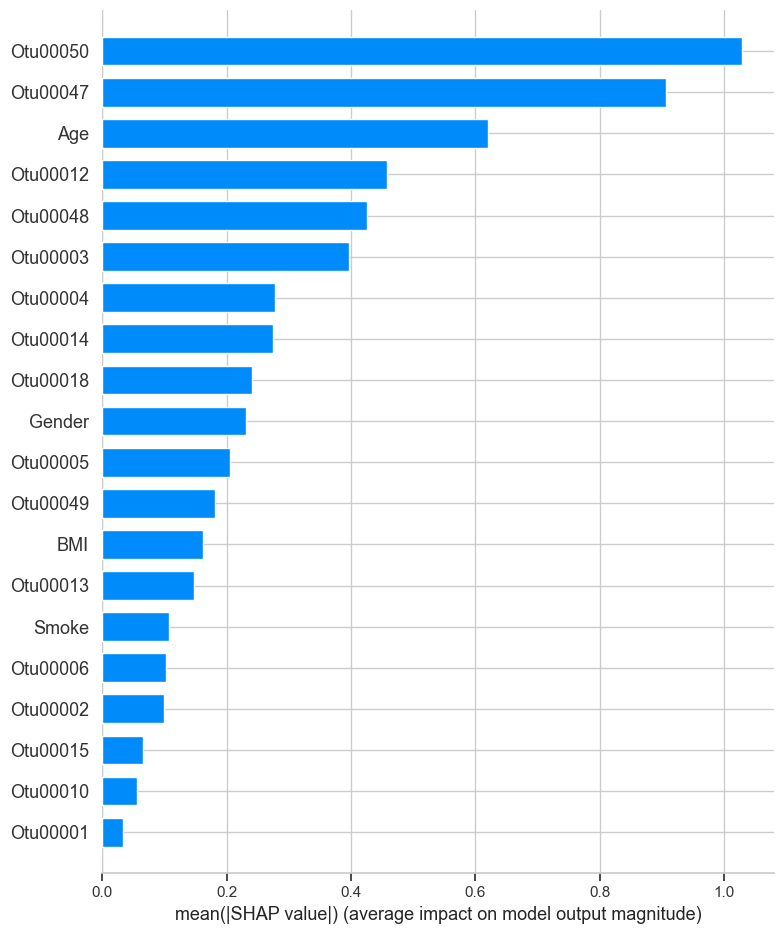

In [72]:
shap.summary_plot(best_shap_values_rf1, x_test1, plot_type="bar", feature_names=x.columns)

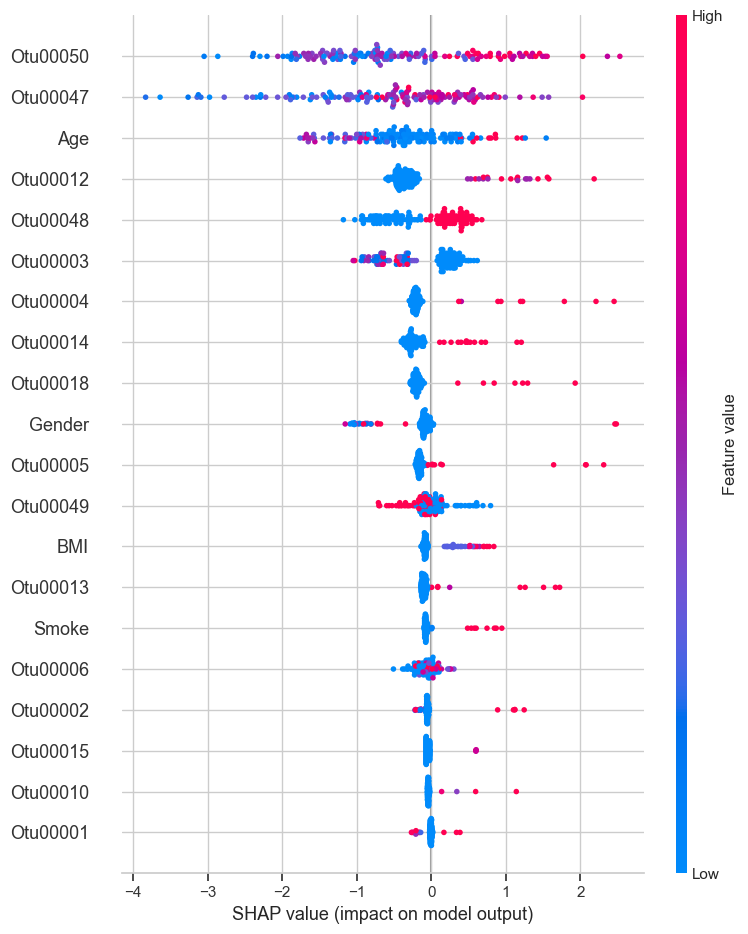

In [73]:
shap.summary_plot(best_shap_values_rf1, x_test1, feature_names=x.columns)

In [74]:
shap.initjs()

In [75]:
# explainer5xg = shap.TreeExplainer(xgb_model)
# shap_values5xgb = explainer5xgb.shap_values(x_test)
# shap.initjs()
def local_explainer_rf1(j):
    return(shap.force_plot(best_explainer_rf1.expected_value, best_shap_values_rf1[j,:], x_test1.iloc[j,:]))
def local_explainer_rf1_logit(j):
    return(shap.force_plot(best_explainer_rf1.expected_value, best_shap_values_rf1[j,:], x_test1.iloc[j,:], link='logit'))

In [85]:
local_explainer_rf1_logit(16)

In [80]:
y_test1

array([0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [ ]:
# Read the taxonomy data with the header
taxonomy_df = pd.read_table("../data/baxter.taxonomy", sep='\t')

# Function to extract genus from taxonomy string
def extract_genus(taxonomy_str):
    taxa_levels = taxonomy_str.strip(';').split(';')
    genus_info = taxa_levels[-1]  # Get the last item which should be genus
    genus_name = genus_info.split('(')[0]  # Remove the confidence score
    return genus_name

# Apply the function to extract genus names
taxonomy_df['Genus'] = taxonomy_df['Taxonomy'].apply(extract_genus)

# Create a dictionary mapping OTU IDs to Genus names
otu_to_genus = dict(zip(taxonomy_df['OTU'], taxonomy_df['Genus']))

# Replace OTU IDs with Genus names in feature names
new_feature_names = [otu_to_genus.get(otu_id, otu_id) for otu_id in x.columns]

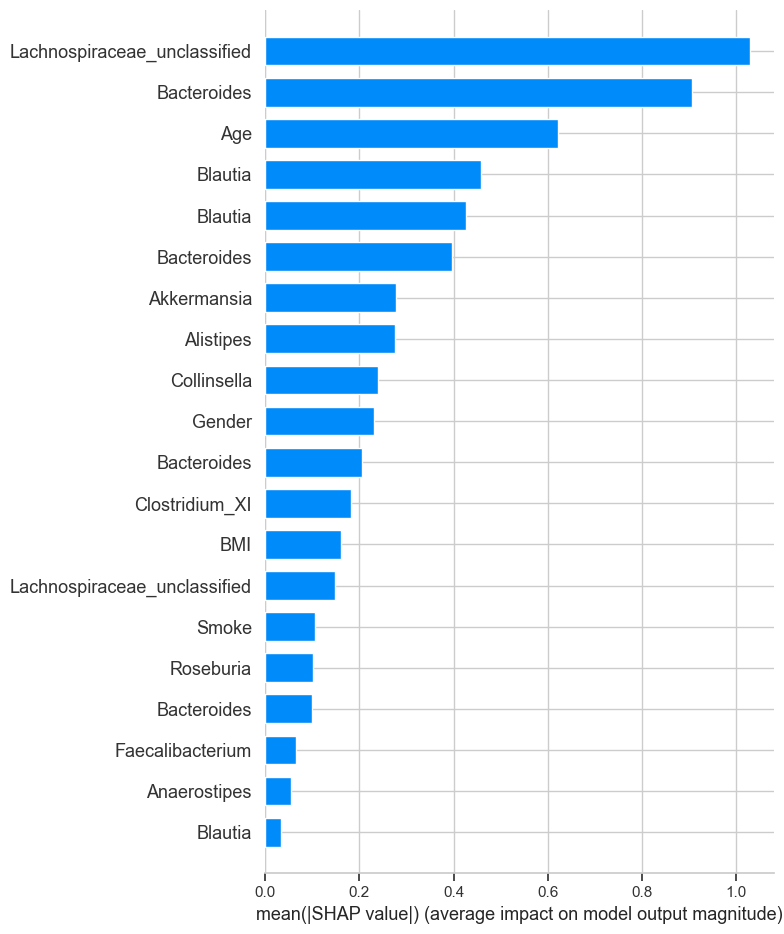

In [92]:
# Use the new feature names in the SHAP summary plot
shap.summary_plot(best_shap_values_rf1, x_test1, plot_type="bar", feature_names=new_feature_names)